Chapter 25
# 社交网络分析SNA
Book_6《数据有道》 | 鸢尾花书：从加减乘除到机器学习

改编自
https://networkx.org/nx-guides/content/exploratory_notebooks/facebook_notebook.html

In [1]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from random import randint
import seaborn as sns

## 导入数据

In [2]:
facebook = pd.read_csv(
    "data/facebook_combined.txt.gz",
    compression="gzip",
    sep=" ",
    names=["start_node", "end_node"])

In [3]:
facebook.head(5)

,start_node,end_node
0,0,1
1,0,2
2,0,3
3,0,4
4,0,5


In [4]:
len(facebook)

88234

## 创建无向图

In [5]:
# 为了加快运算速度，仅仅随机取出5000行数据
# G = nx.from_pandas_edgelist(facebook.sample(n=5000), "start_node", "end_node")
# 为了加快运算速度，取出前5000行数据
G = nx.from_pandas_edgelist(facebook.head(5000), "start_node", "end_node")

In [6]:
plot_options = {"node_size": 18, 
                "with_labels": False, 
                "width": 0.15, 
                "edge_color": '0.18',
                "alpha": 0.28}

pos = nx.spring_layout(G, iterations=15, seed=1721)

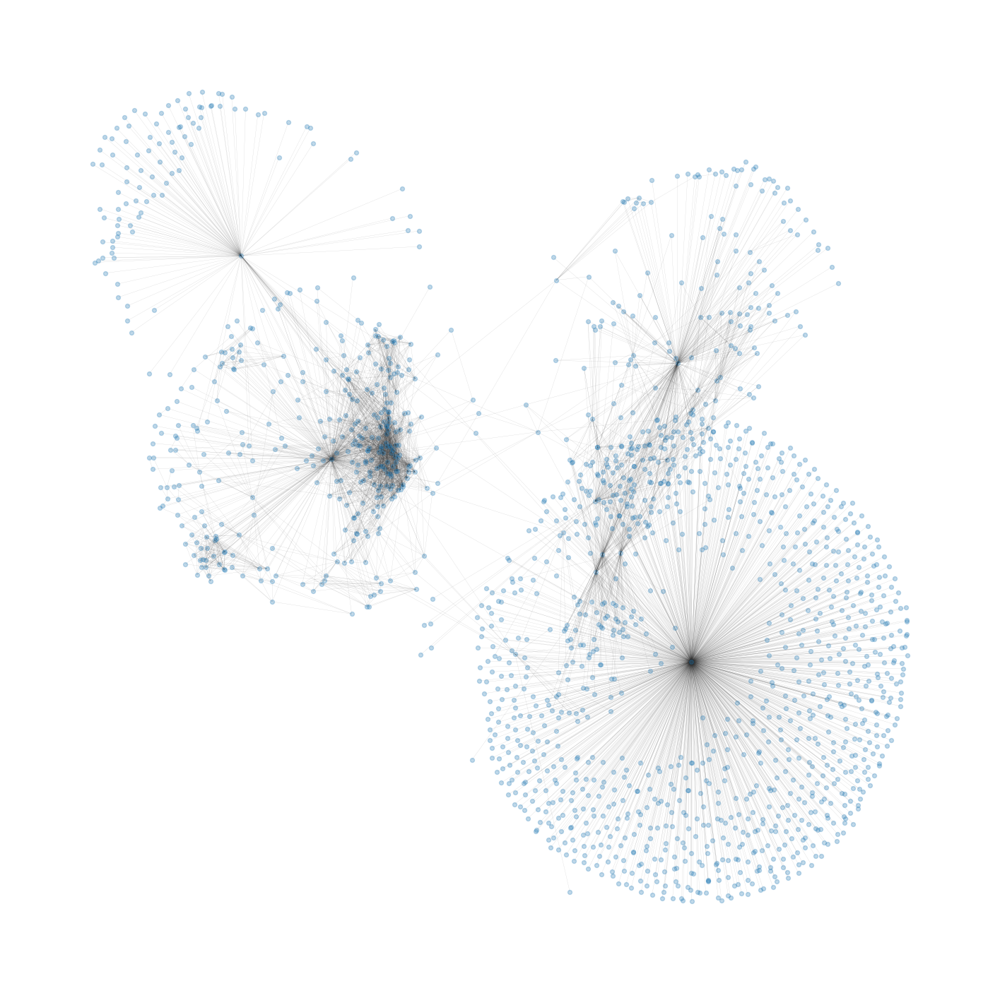

In [7]:
# 可视化社交关系图

fig, ax = plt.subplots(figsize=(18, 18))
ax.axis("off")
nx.draw_networkx(G, pos=pos, ax=ax, **plot_options)

In [8]:
# 无向图节点数
G.number_of_nodes()

1724

In [9]:
# 无向图边数
G.number_of_edges()

5000

In [10]:
# 无向图连通分量数量
nx.number_connected_components(G)

1

## 度分析

In [11]:
degree_sequence = sorted((d for n, d in G.degree()), 
                         reverse=True)
# 度数大小排序
dmax = max(degree_sequence)

In [12]:
dict_degree = dict(G.degree())
# 将结果转为字典

### 节点度数排序

Text(0.5, 0, 'Rank')

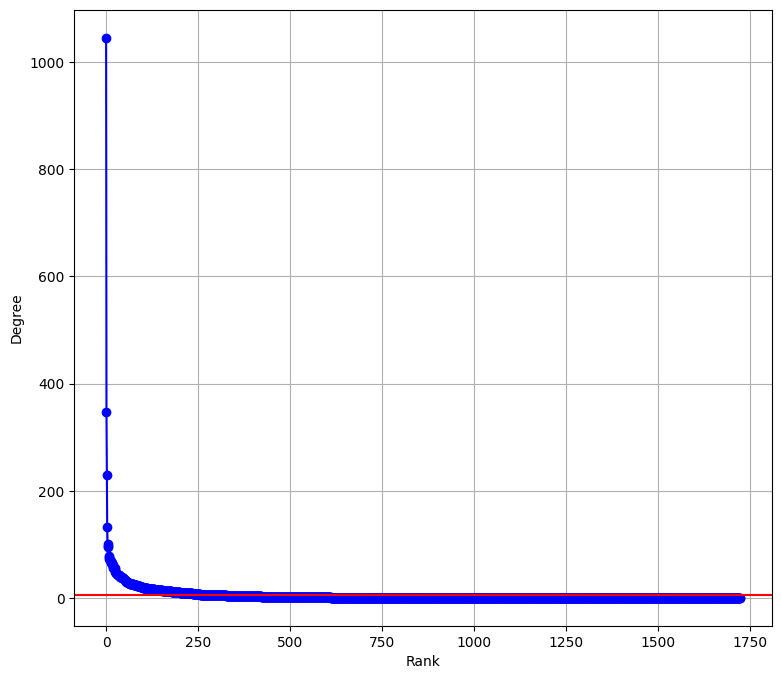

In [13]:
mean_degree = np.mean([d for _, d in G.degree()])
# 节点度数均值

# 节点度数排序
fig, ax = plt.subplots(figsize = (9,8))
ax.plot(degree_sequence, "b-", marker="o")
ax.grid()
ax.axhline(y = mean_degree, color = 'r')
ax.set_ylabel("Degree")
ax.set_xlabel("Rank")
# ax.set_xscale('log')

### 节点度数柱状图

Text(0, 0.5, 'Number of Nodes')

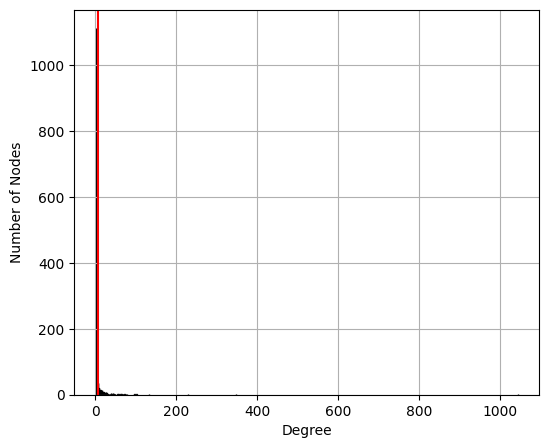

In [14]:
# 节点度数柱状图

fig, ax = plt.subplots(figsize = (6,5))
ax.bar(*np.unique(degree_sequence, return_counts=True),ec = 'k')
ax.axvline(x = mean_degree, color = 'r')
ax.grid()
ax.set_xlabel("Degree")
ax.set_ylabel("Number of Nodes")
# ax.set_xscale('log')
# plt.savefig('度数柱状图.svg')

In [15]:
# 自定义函数，过滤dict
def filter_value(dict_, unique):
    
    newDict = {}
    for (key, value) in dict_.items():
        if value == unique:
            newDict[key] = value
            
    return newDict

### 根据度数大小渲染节点

C:\Users\james\anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:437: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


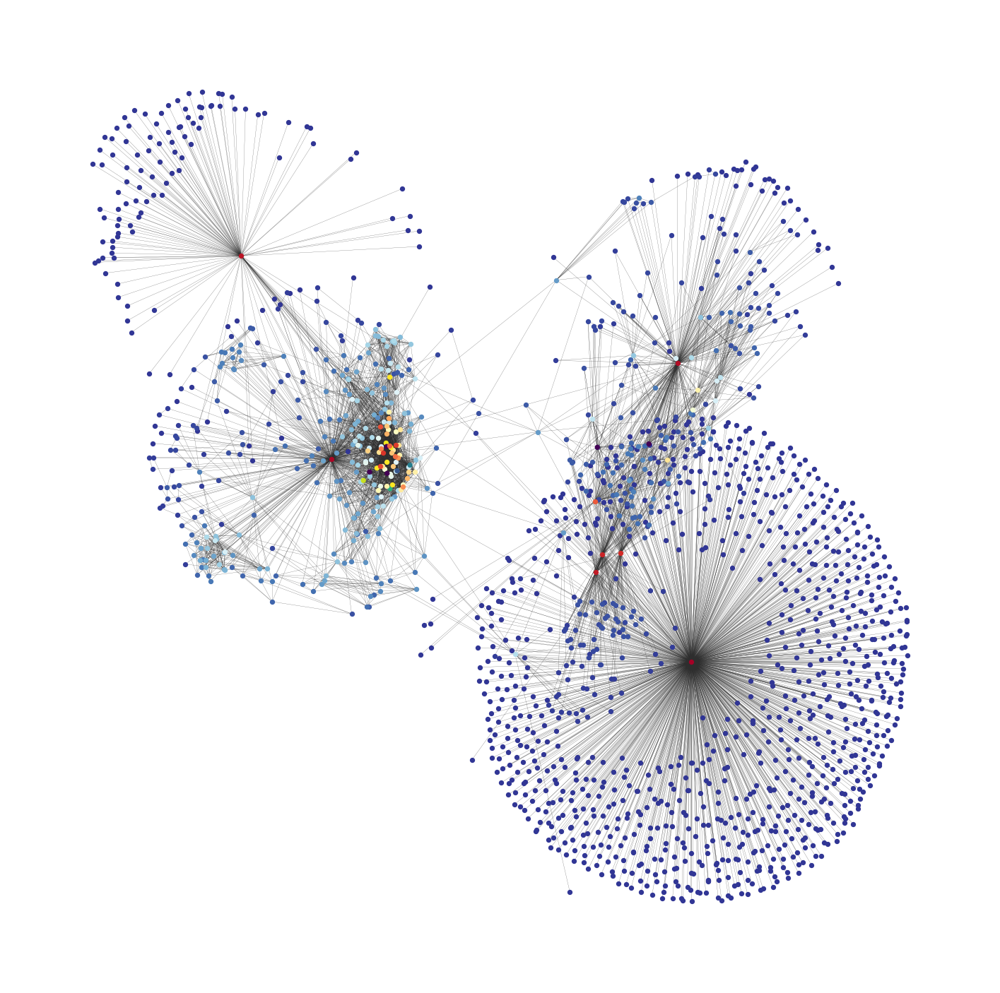

In [16]:
unique_deg = sorted(set(degree_sequence))
# 取出节点度数独特值

colors = plt.cm.RdYlBu_r(np.linspace(0, 1, len(unique_deg)))
# 独特值的颜色映射

fig, ax = plt.subplots(figsize=(18, 18))
ax.axis("off")
nx.draw_networkx_edges(G, pos, edge_color = '0.18',
                       width = 0.15)
# 绘制图的边

# 分别绘制不同度数节点
for deg_i, color_i in zip(unique_deg,colors):
    
    dict_i = filter_value(dict_degree,deg_i)
    nx.draw_networkx_nodes(G, pos, 
                           nodelist = list(dict_i.keys()), 
                           node_size=18,
                           node_color = color_i[:3])
# plt.savefig('根据度数大小渲染节点.svg')

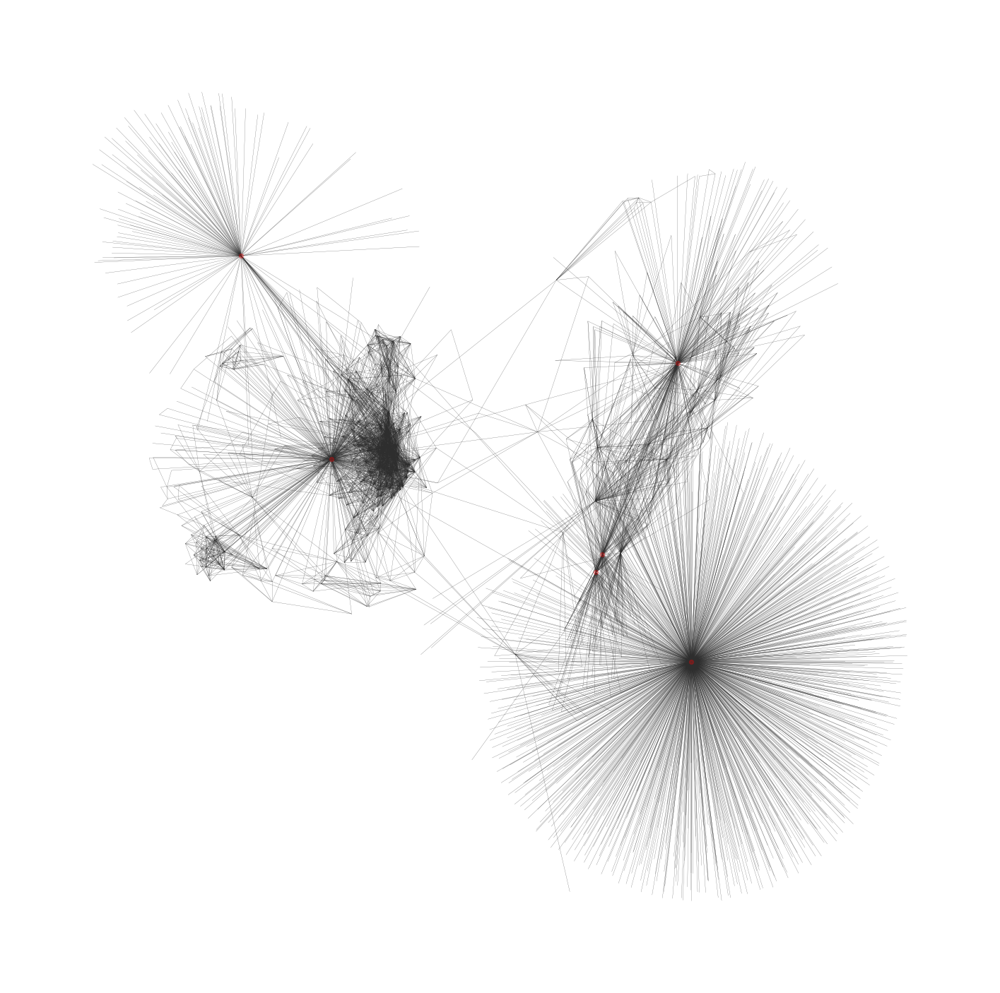

In [17]:
# 取出度数超过 100
deg_threshold = 100

fig, ax = plt.subplots(figsize=(18, 18))
ax.axis("off")
nx.draw_networkx_edges(G, pos, edge_color = '0.18',
                       width = 0.15)
# 绘制图的边

for deg_i in reversed(unique_deg):
    
    dict_i = filter_value(dict_degree,deg_i)
    nx.draw_networkx_nodes(G, pos, 
                           nodelist = list(dict_i.keys()), 
                           node_size=18,
                           node_color = 'red',
                           alpha = 0.28)
    # print(deg_i)
    if deg_i <= deg_threshold:
        break

## 图距离

In [18]:
shortest_path_lengths = dict(nx.all_pairs_shortest_path_length(G))

### 节点平均距离

In [19]:
average_path_lengths = [np.mean(list(spl.values())) 
                        for spl in shortest_path_lengths.values()]

average_all = np.mean(average_path_lengths)
# 节点平均图距离的均值

Text(0, 0.5, 'Count')

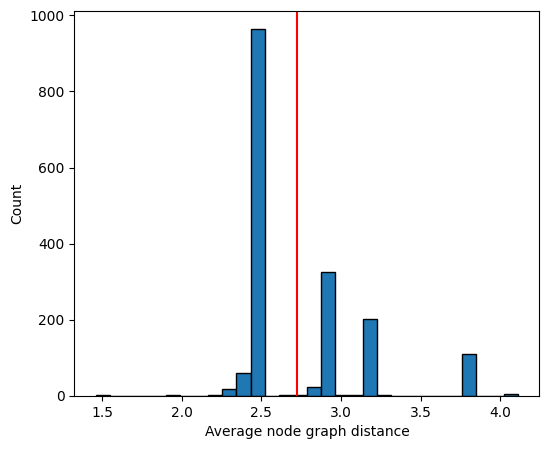

In [20]:
# 绘制直方图
fig, ax = plt.subplots(figsize = (6,5))
plt.hist(average_path_lengths, ec = 'k', bins = 30)
plt.axvline(x = average_all, c = 'r')
plt.xlabel('Average node graph distance')
plt.ylabel('Count')
# plt.savefig('节点图距离直方图.svg')

### 图距离分布

Text(0, 0.5, 'Frequency (%)')

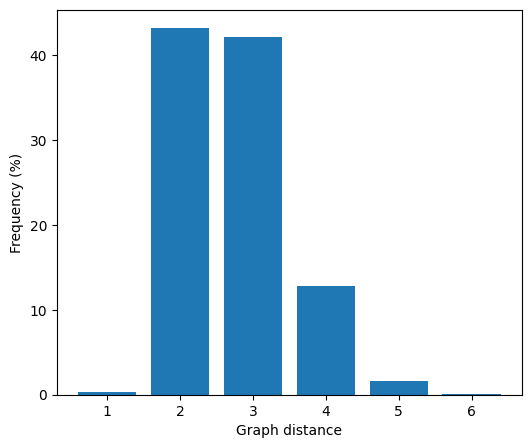

In [21]:
diameter = nx.diameter(G)
path_lengths = np.zeros(diameter + 1, dtype=int)

for pls in shortest_path_lengths.values():
    pl, cnts = np.unique(list(pls.values()), return_counts=True)
    path_lengths[pl] += cnts

freq_percent = 100 * path_lengths[1:] / path_lengths[1:].sum()

fig, ax = plt.subplots(figsize = (6,5))
ax.bar(np.arange(1, diameter + 1), height=freq_percent)
ax.set_xlabel("Graph distance")
ax.set_ylabel("Frequency (%)")

### 根据节点平均图距离大小渲染节点

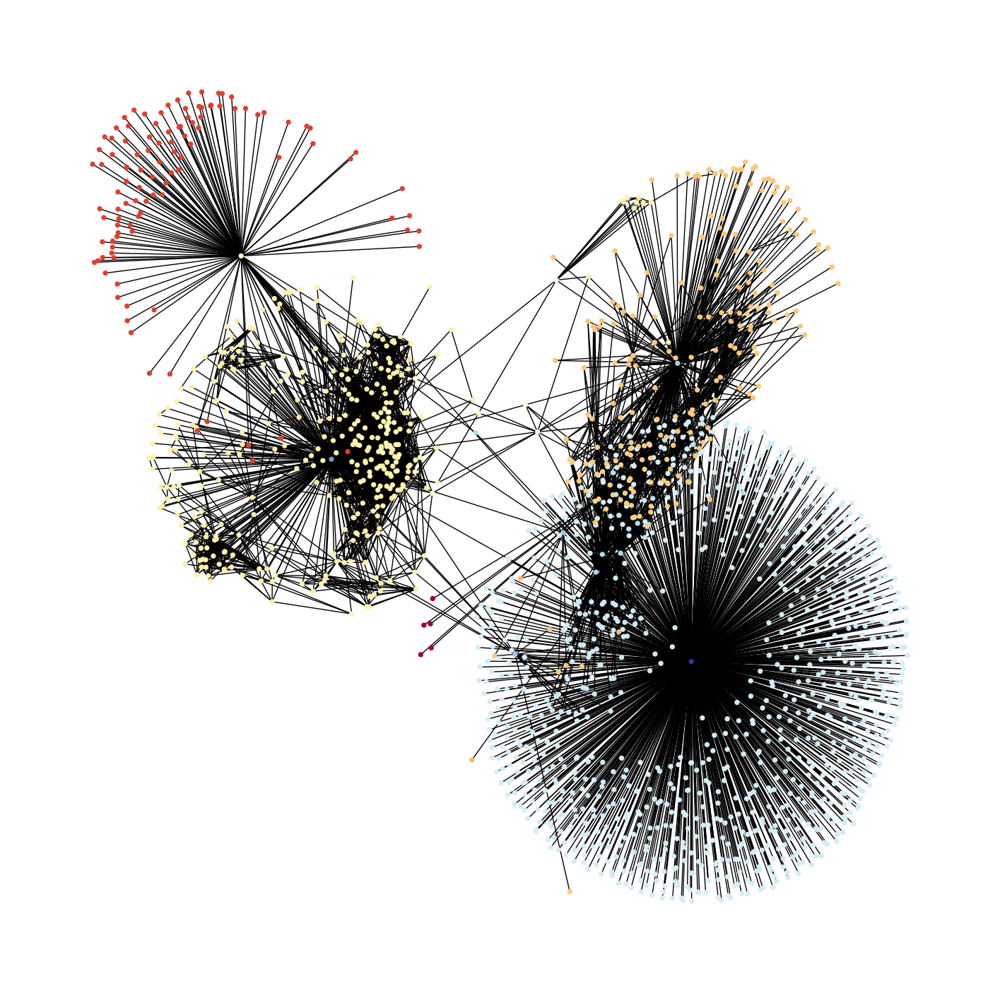

In [22]:
unique_ave_graph_d = set(average_path_lengths)
# 取出节点离心率独特值

# colors = plt.cm.RdYlBu(np.linspace(0, 1, len(unique_ave_graph_d)))
# 独特值的颜色映射

fig, ax = plt.subplots(figsize=(18, 18))
ax.axis("off")
nx.draw_networkx(G, pos, 
                 cmap = 'RdYlBu_r', 
                 with_labels = False,
                 node_size=18,
                 node_color = average_path_lengths)

### 图距离矩阵

<Axes: >

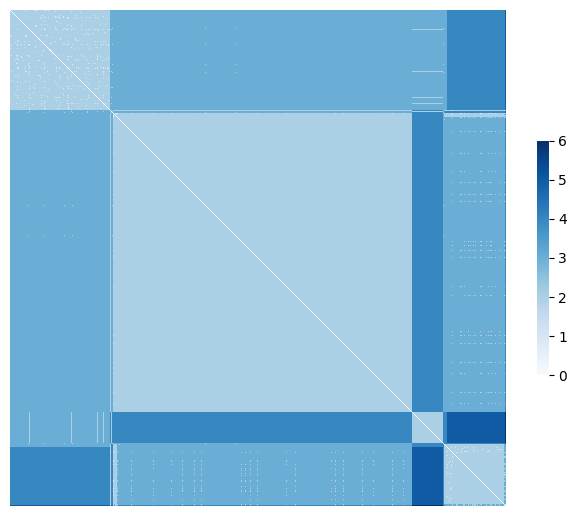

In [23]:
Shortest_D_matrix = np.array([[v[j] for j in list(shortest_path_lengths.keys())] 
          for k, v in shortest_path_lengths.items()])

fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(Shortest_D_matrix, cmap = 'Blues', 
            annot = False,
            xticklabels = [],
            yticklabels = [],
            ax = ax,
            cbar_kws={'shrink': 0.38},
            square = True,
            cbar = True)

## 离心率

In [24]:
eccentricity = nx.eccentricity(G)
# 计算每个节点离心率
eccentricity_list = list(eccentricity.values())

### 根据离心率大小渲染节点

C:\Users\james\anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:437: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


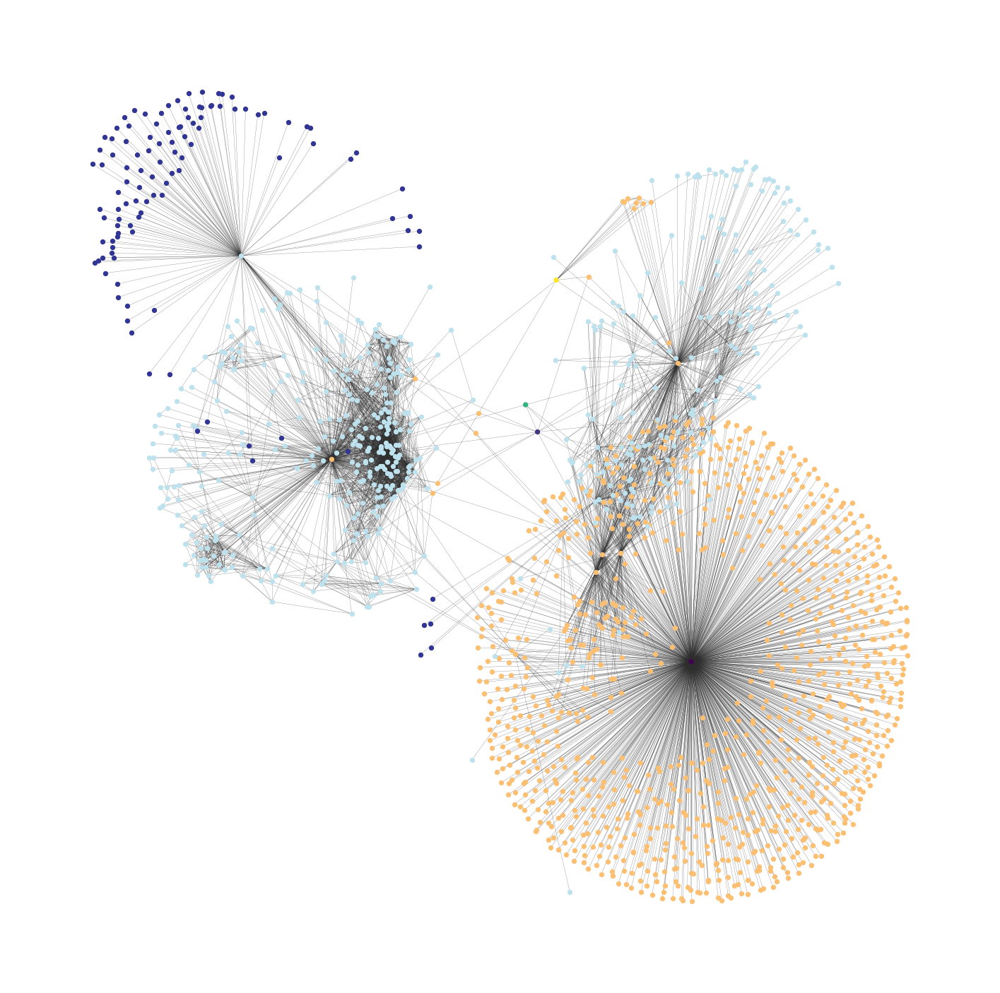

In [25]:
unique_ecc = set(eccentricity_list)
# 取出节点离心率独特值

colors = plt.cm.RdYlBu(np.linspace(0, 1, len(unique_ecc)))
# 独特值的颜色映射

fig, ax = plt.subplots(figsize=(18, 18))
ax.axis("off")
nx.draw_networkx_edges(G, pos, edge_color = '0.18',
                       width = 0.15)
# 绘制图的边

# 分别绘制不同离心率
for deg_i, color_i in zip(unique_ecc,colors):
    
    dict_i = filter_value(eccentricity,deg_i)
    nx.draw_networkx_nodes(G, pos, 
                           node_size=18,
                           nodelist = list(dict_i.keys()), 
                           node_color = color_i)

### 图离心率柱状图

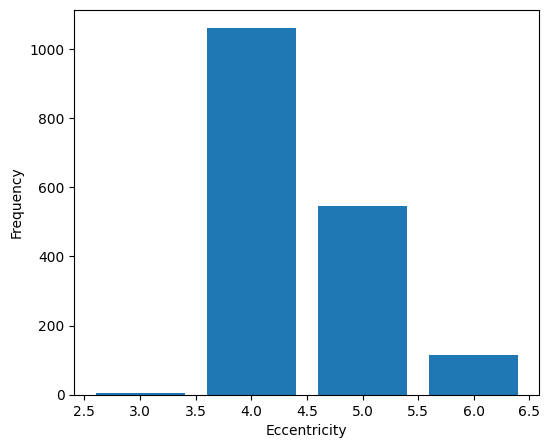

In [26]:
# 使用numpy.unique函数获取独特值及其出现次数
unique_values, counts = np.unique(eccentricity_list, 
                                  return_counts=True)

# 绘制柱状图
fig, ax = plt.subplots(figsize = (6,5))
plt.bar(unique_values, counts)
plt.xlabel('Eccentricity')
plt.ylabel('Frequency')
plt.savefig('图离心率柱状图.svg')

In [27]:
# 图直径

diameter = nx.diameter(G)
diameter

6

In [28]:
# 图半径

radius = nx.radius(G)
radius

3

## 中心性

### 度中心性

In [29]:
degree_centrality = nx.centrality.degree_centrality(G)

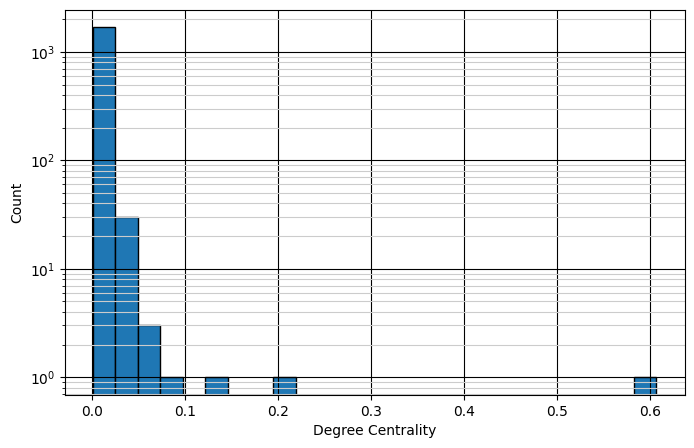

In [30]:

# 度中心性直方图

fig, ax = plt.subplots(figsize = (8,5))
plt.hist(degree_centrality.values(), bins=25, ec = 'k')
plt.xlabel("Degree Centrality")
plt.ylabel("Count")
plt.yscale('log')
plt.grid(which='major', color='k', linestyle='-')
plt.grid(which='minor', color='0.8', linestyle='-')

(-1.1711154401302337,
 0.8007862985134124,
 -0.7729127749800682,
 1.010482881963253)

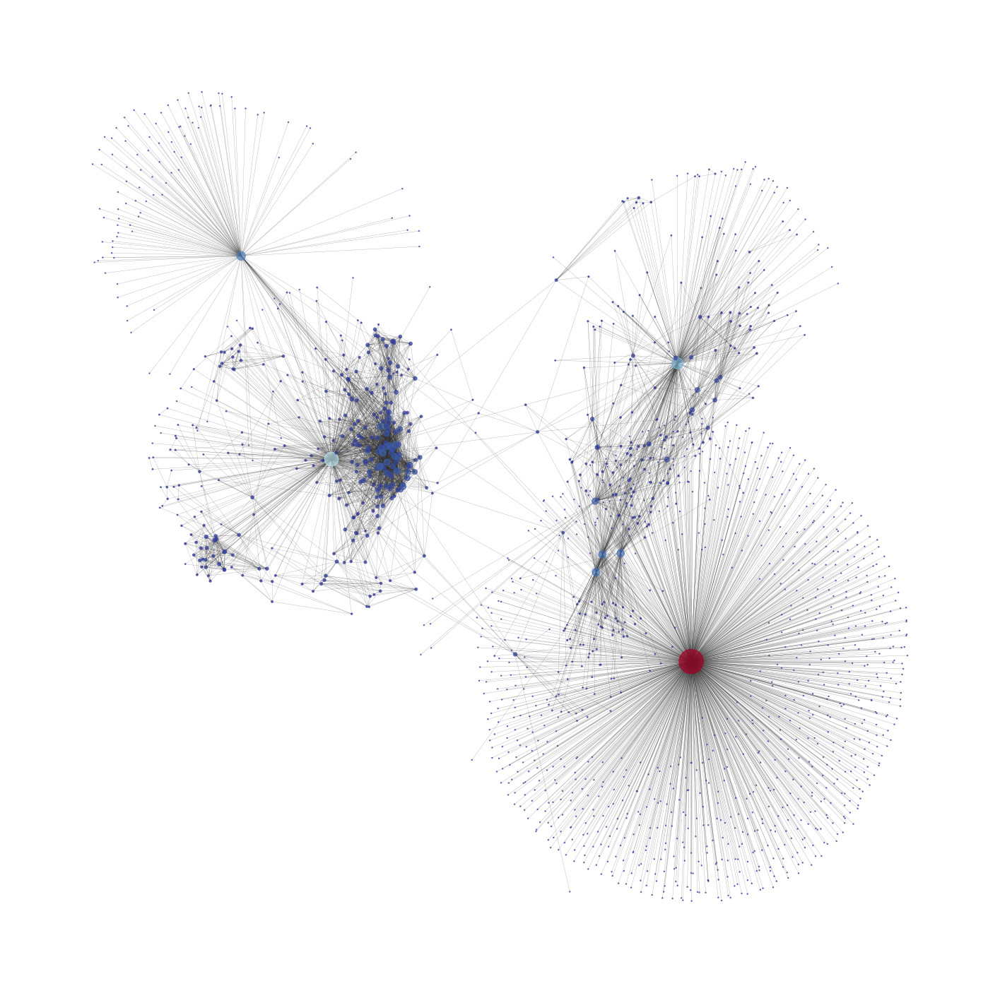

In [31]:
node_size = [v * 1000 for v in degree_centrality.values()]

fig, ax = plt.subplots(figsize=(18, 18))
nx.draw_networkx(G, pos=pos, 
                 node_size=node_size, 
                 edge_color = '0.18',
                 with_labels=False, 
                 cmap = 'RdYlBu_r',
                 node_color = node_size,
                 alpha = 0.68,
                 width=0.15)
plt.axis("off")

### 介数中心性

In [32]:
betweenness_centrality = nx.centrality.betweenness_centrality(G)  

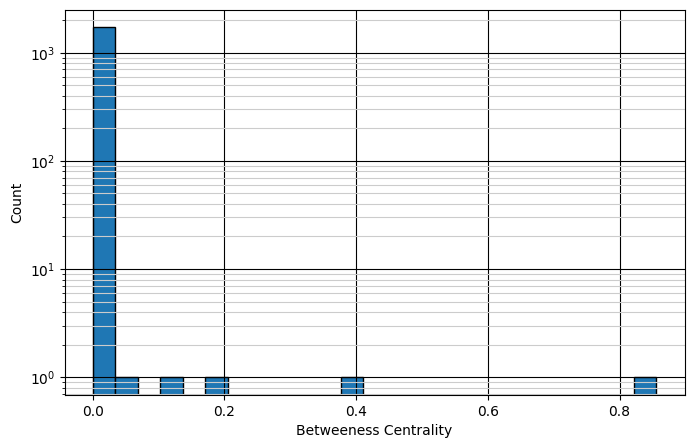

In [33]:
# 介数中心性直方图

fig, ax = plt.subplots(figsize = (8,5))
plt.hist(betweenness_centrality.values(), bins=25, ec = 'k')
plt.xlabel("Betweeness Centrality")
plt.ylabel("Count")
plt.yscale('log')
plt.grid(which='major', color='k', linestyle='-')
plt.grid(which='minor', color='0.8', linestyle='-')

(-1.1711154401302337,
 0.8007862985134124,
 -0.7729127749800682,
 1.010482881963253)

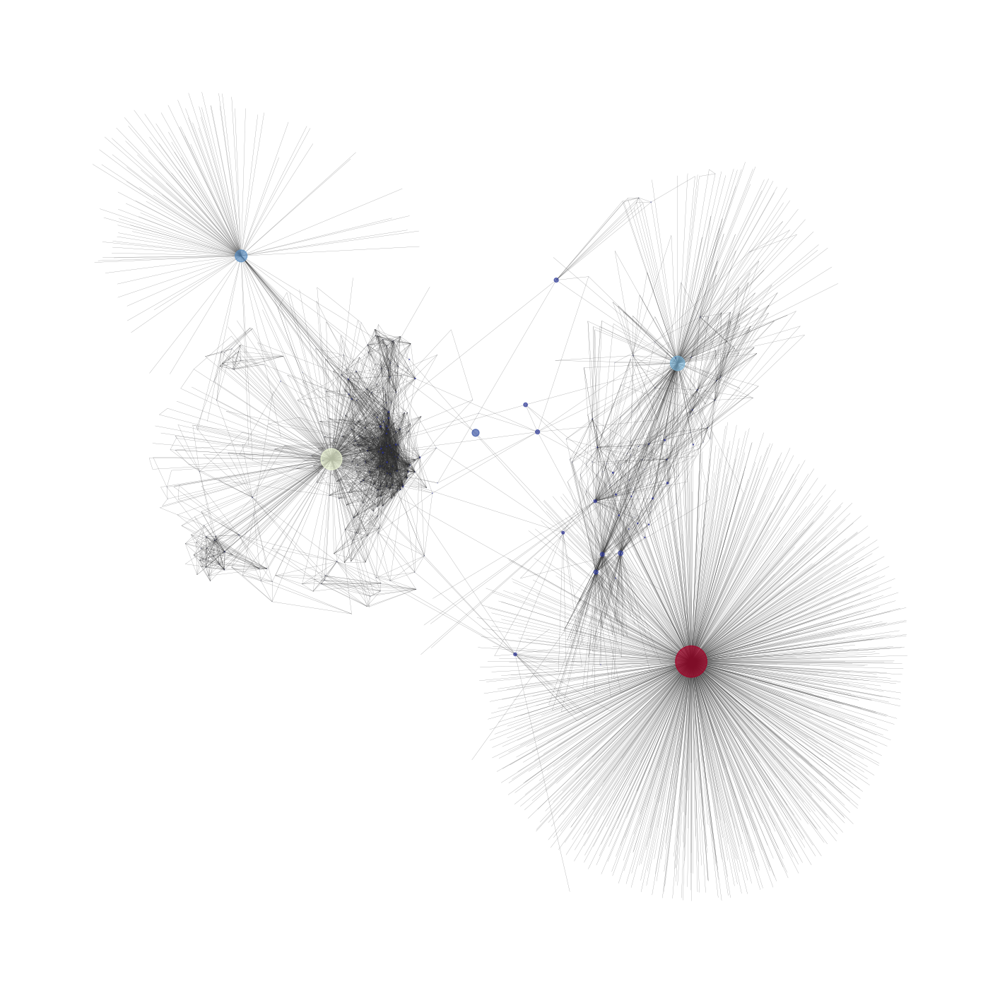

In [34]:
node_size = [v * 1200 for v in betweenness_centrality.values()]
fig, ax = plt.subplots(figsize=(18, 18))
nx.draw_networkx(G, pos=pos, 
                 node_size=node_size, 
                 edge_color = '0.18',
                 with_labels=False, 
                 cmap = 'RdYlBu_r',
                 node_color = node_size,
                 alpha = 0.68,
                 width=0.15)
plt.axis("off")

### 紧密中心性

In [35]:
closeness_centrality = nx.centrality.closeness_centrality(G)  

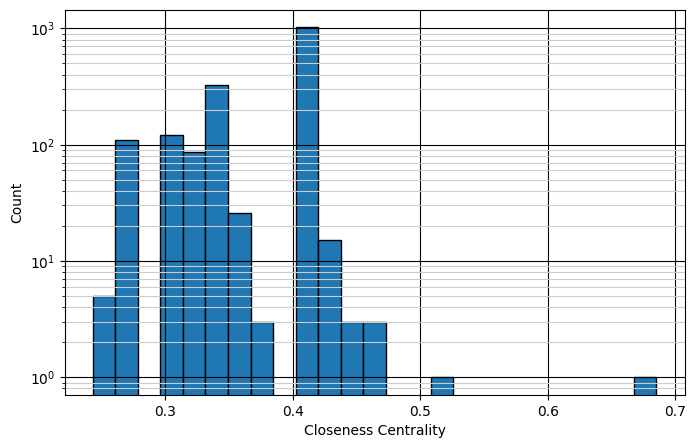

In [36]:
# 紧密中心性直方图

fig, ax = plt.subplots(figsize = (8,5))
plt.hist(closeness_centrality.values(), bins=25, ec = 'k')
plt.xlabel("Closeness Centrality")
plt.ylabel("Count")
plt.yscale('log')
plt.grid(which='major', color='k', linestyle='-')
plt.grid(which='minor', color='0.8', linestyle='-')

(-1.1711154401302337,
 0.8007862985134124,
 -0.7729127749800682,
 1.010482881963253)

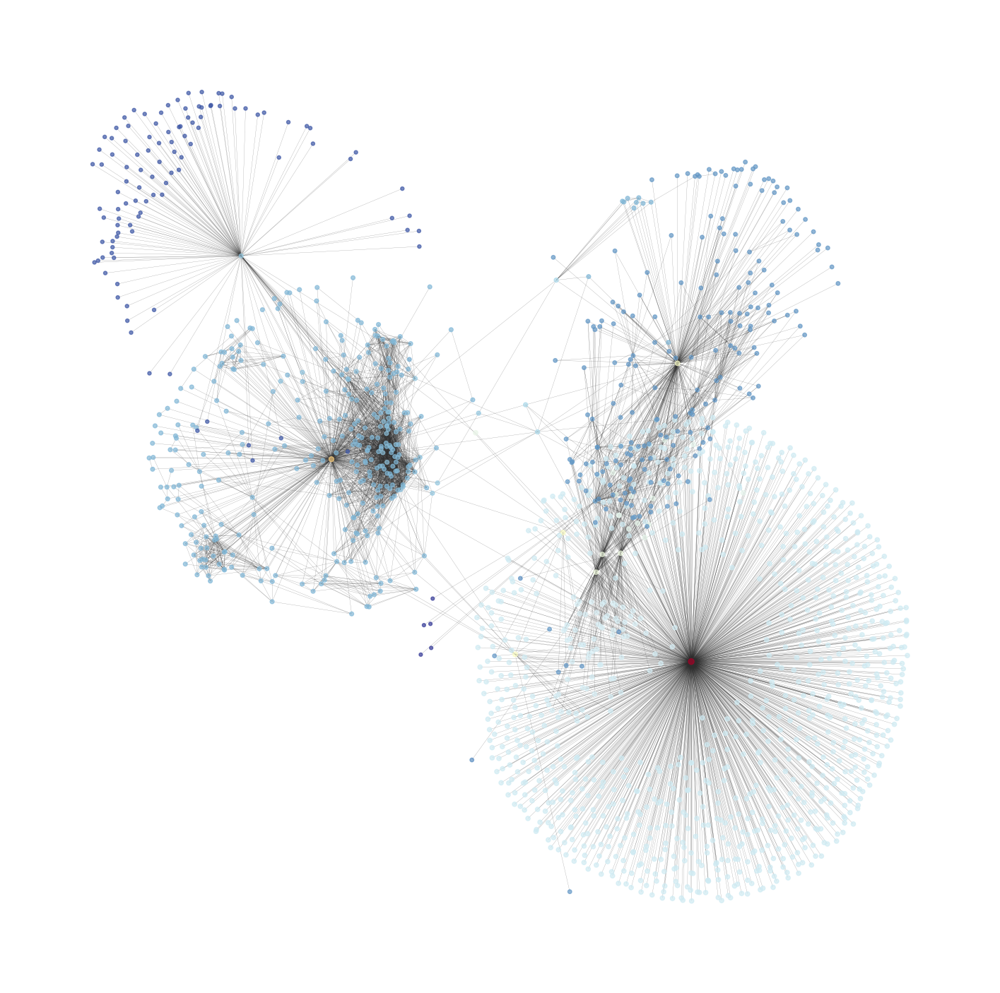

In [37]:
node_size = [v * 50 for v in closeness_centrality.values()] 
fig, ax = plt.subplots(figsize=(18, 18))
nx.draw_networkx(G, pos=pos, 
                 node_size=node_size, 
                 edge_color = '0.18',
                 with_labels=False, 
                 cmap = 'RdYlBu_r',
                 node_color = node_size,
                 alpha = 0.68,
                 width=0.15)
plt.axis("off")

### 特征向量中心性

In [38]:
eigenvector_centrality = nx.centrality.eigenvector_centrality(G) 

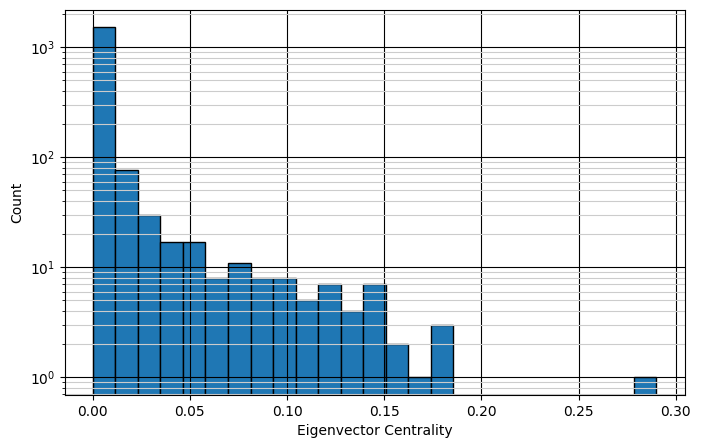

In [39]:
# 特征向量中心性直方图

fig, ax = plt.subplots(figsize = (8,5))
plt.hist(eigenvector_centrality.values(), bins=25, ec = 'k')
plt.xlabel("Eigenvector Centrality")
plt.ylabel("Count")
plt.yscale('log')
plt.grid(which='major', color='k', linestyle='-')
plt.grid(which='minor', color='0.8', linestyle='-')

(-1.1711154401302337,
 0.8007862985134124,
 -0.7729127749800682,
 1.010482881963253)

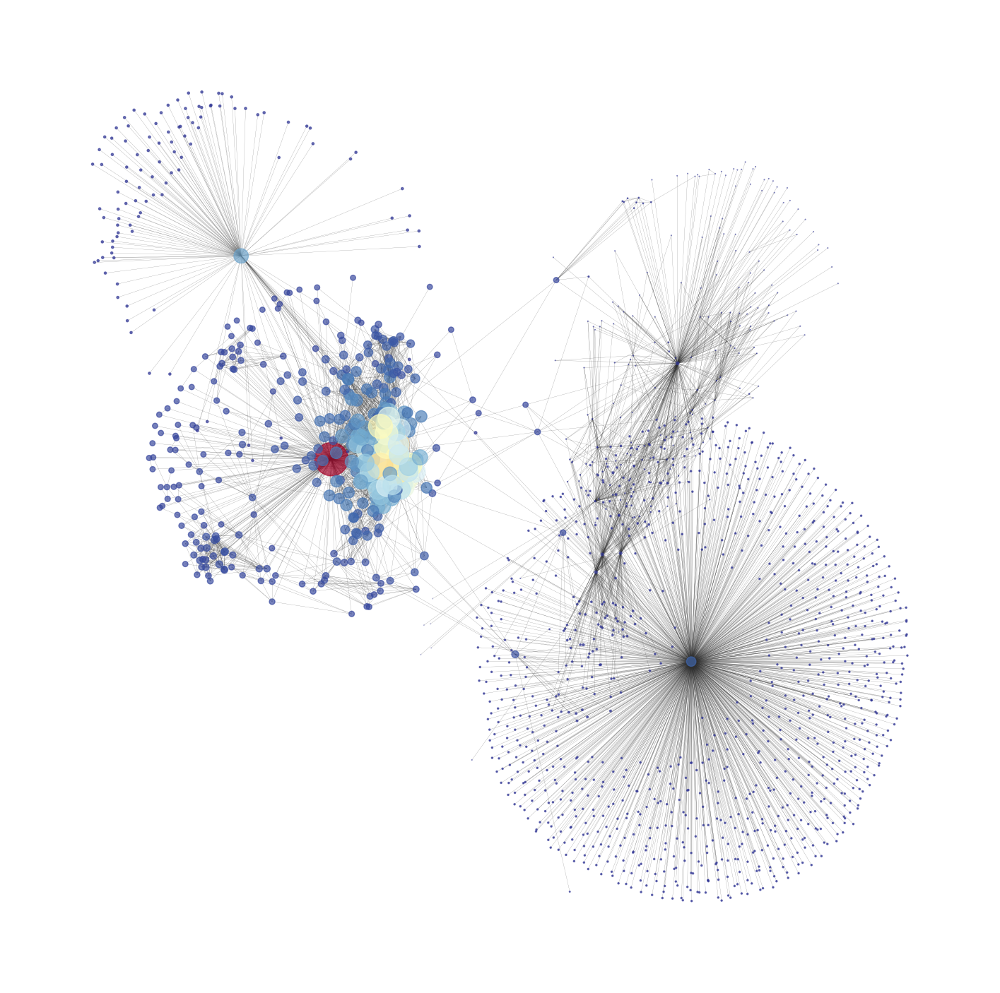

In [40]:
node_size = [v * 4000 for v in eigenvector_centrality.values()]
fig, ax = plt.subplots(figsize=(18, 18))
nx.draw_networkx(G, pos=pos, 
                 node_size=node_size, 
                 edge_color = '0.18',
                 with_labels=False, 
                 cmap = 'RdYlBu_r',
                 node_color = node_size,
                 alpha = 0.68,
                 width=0.15)
plt.axis("off")

## 桥

In [41]:
nx.has_bridges(G)

True

In [42]:
bridges = list(nx.bridges(G))
len(bridges)

1113

(-1.1711154401302337,
 0.8007862985134124,
 -0.7729127749800682,
 1.010482881963253)

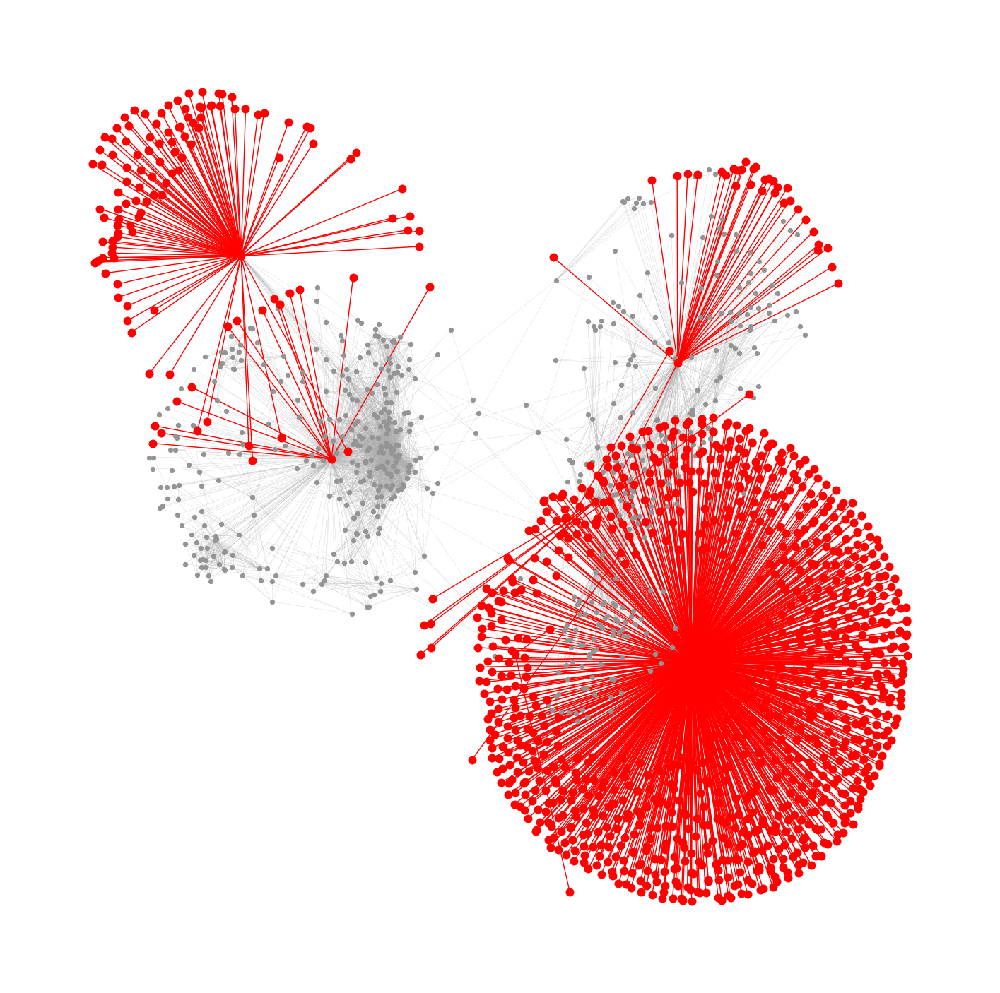

In [43]:
fig, ax = plt.subplots(figsize=(18, 18))
nx.draw_networkx(G, pos=pos, 
                 node_size=18, 
                 edge_color = '0.68',
                 with_labels=False, 
                 width=0.15, node_color = '0.58')

nx.draw_networkx_nodes(G,
                       pos=pos, 
                       nodelist = set(sum(bridges, ())),
                       node_color = 'r',
                       node_size = 58)

nx.draw_networkx_edges(G, pos, 
                       edgelist=bridges, 
                       width=1, edge_color="r")

plt.axis("off")

### 局部桥

In [44]:
local_bridges = list(nx.local_bridges(G, with_span=False))
len(local_bridges)

1119

(-1.1711154401302337,
 0.8007862985134124,
 -0.7729127749800682,
 1.010482881963253)

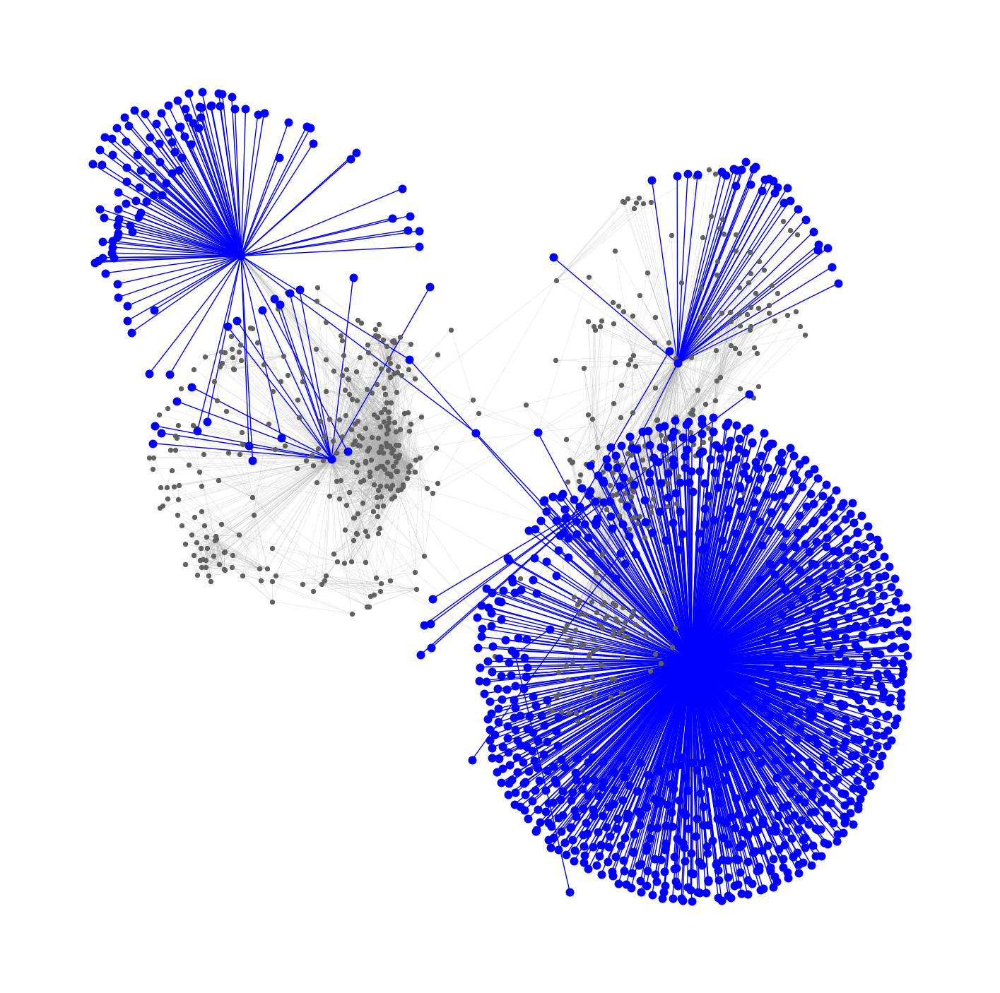

In [45]:
fig, ax = plt.subplots(figsize=(18, 18))
nx.draw_networkx(G, pos=pos, 
                 node_size=18, 
                 edge_color = '0.68',
                 with_labels=False, 
                 width=0.15, node_color = '0.38')

nx.draw_networkx_nodes(G,
                       pos=pos, 
                       nodelist = set(sum(local_bridges, ())),
                       node_color = 'blue',
                       node_size = 58)

nx.draw_networkx_edges(G, pos, 
                       edgelist=local_bridges, 
                       width=1, edge_color="blue")

plt.axis("off")

(-1.1711154401302337,
 0.8007862985134124,
 -0.7729127749800682,
 1.010482881963253)

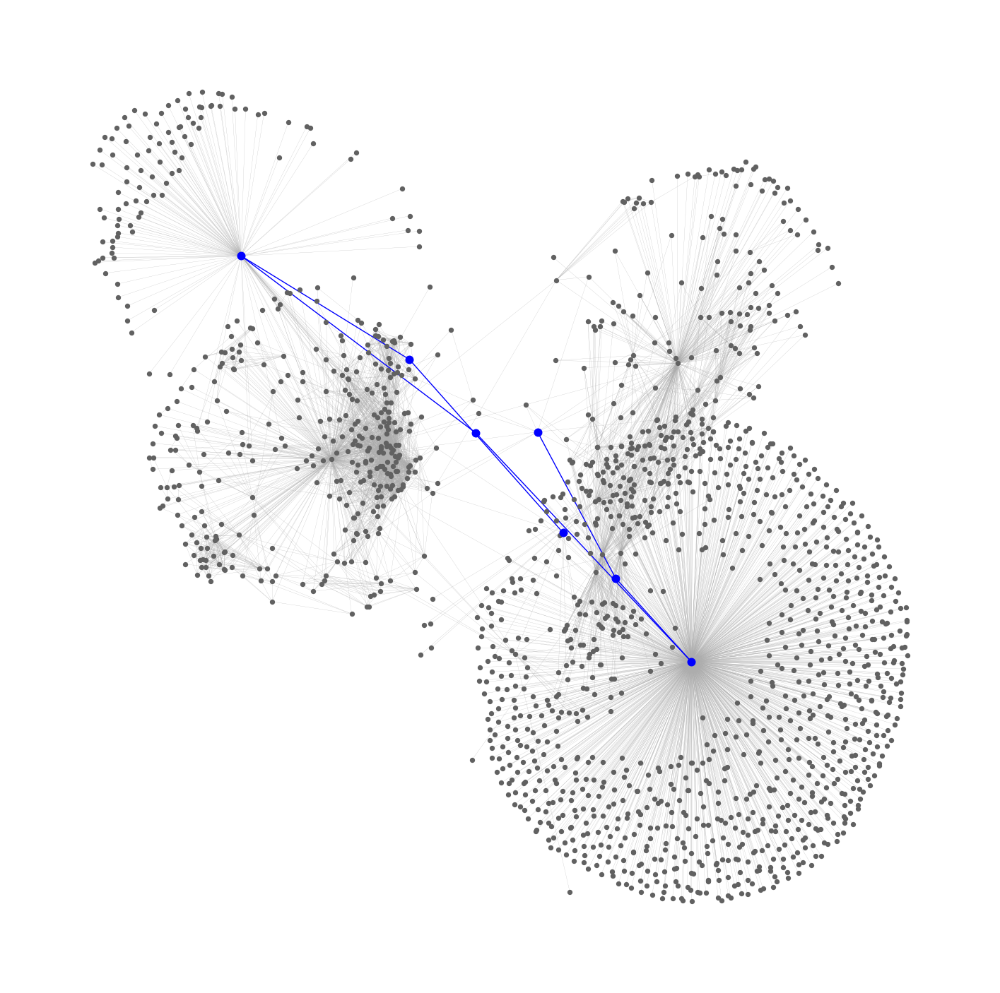

In [46]:
fig, ax = plt.subplots(figsize=(18, 18))
nx.draw_networkx(G, pos=pos, 
                 node_size=18, 
                 edge_color = '0.68',
                 with_labels=False, 
                 width=0.15, node_color = '0.38')
nx.draw_networkx_edges(G, pos, 
                       edgelist=set(local_bridges) - set(bridges), 
                       width=1, edge_color="blue")

nx.draw_networkx_nodes(G,
                       pos=pos, 
                       nodelist = set(sum(list(set(local_bridges) - set(bridges)), ())),
                       node_color = 'blue',
                       node_size = 58)

plt.axis("off")

## 社区

In [47]:
node_mapping = {node: i for i, node in enumerate(G.nodes())}
# 创建一个新图 H
H = nx.relabel_nodes(G, node_mapping)
pos_H = nx.spring_layout(H, iterations=15, seed=1721)
# 这部分代码是为了保证选取部分节点构造无向图时，代码依然能跑通

In [48]:
colors = ["" for x in range(H.number_of_nodes())] 
counter = 0
for com in nx.community.label_propagation_communities(H):
    color = "#%06X" % randint(0, 0xFFFFFF)  
    # creates random RGB color
    counter += 1
    for node in list(com):
        colors[node] = color

In [49]:
counter

22

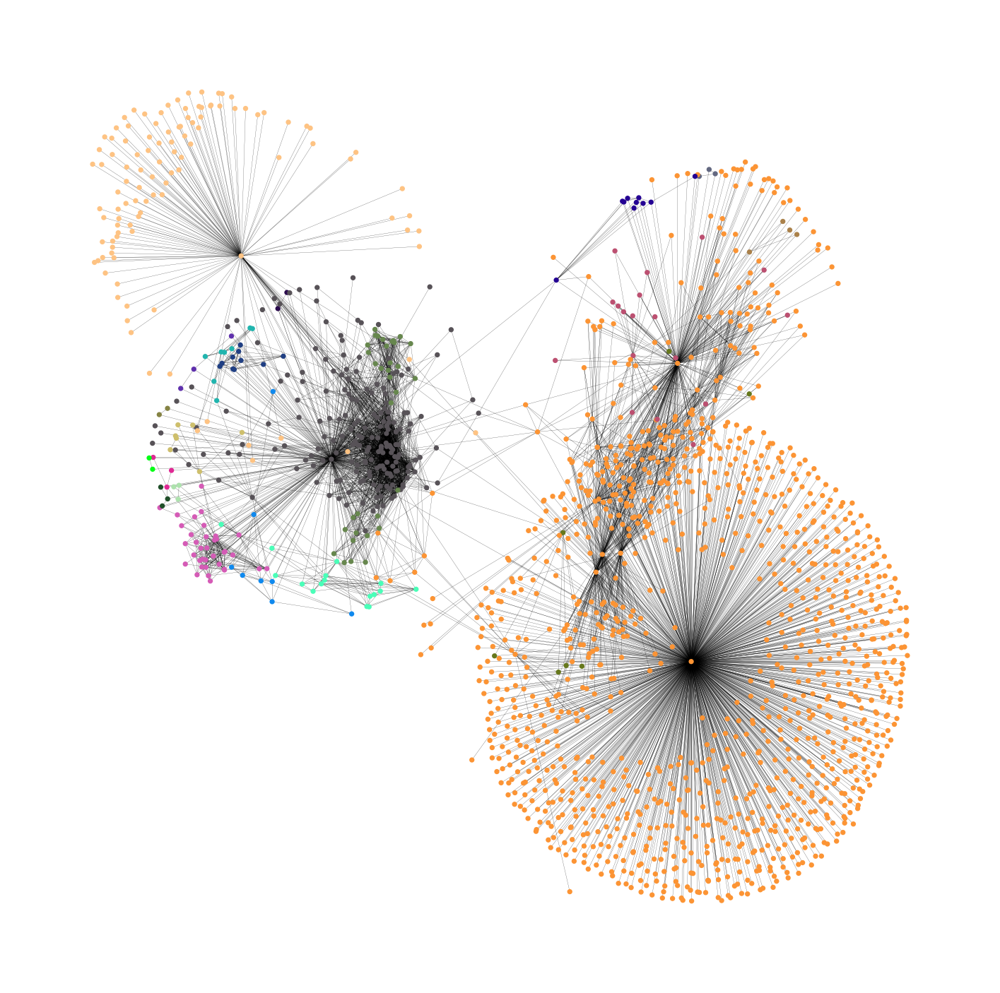

In [50]:
fig, ax = plt.subplots(figsize=(18, 18))
plt.axis("off")
nx.draw_networkx(H, pos=pos_H, 
                 node_size=18, 
                 with_labels=False, 
                 width=0.15, node_color=colors)

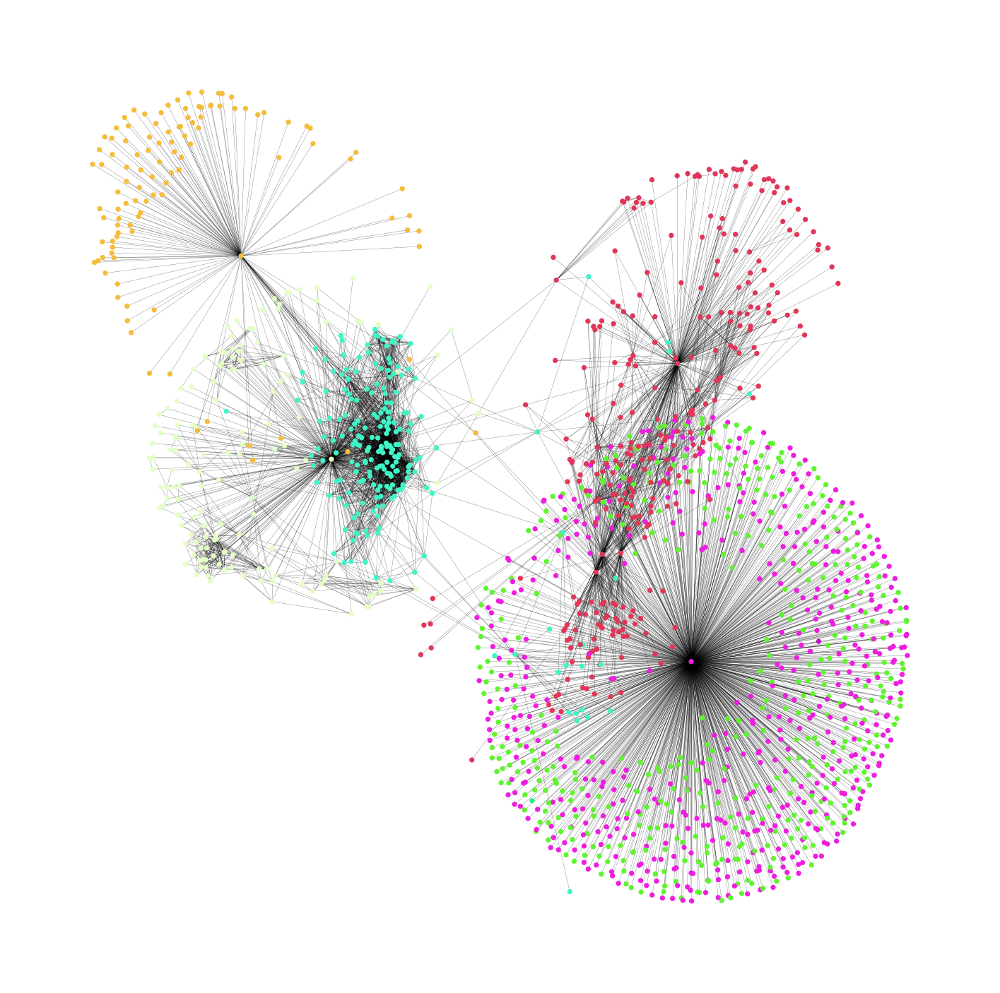

In [51]:
# 社区划分，异步流体社区算法

colors = ["" for x in range(H.number_of_nodes())]
for com in nx.community.asyn_fluidc(H, 8, seed=0):
    color = "#%06X" % randint(0, 0xFFFFFF)  
    # creates random RGB color
    for node in list(com):
        colors[node] = color

fig, ax = plt.subplots(figsize=(18, 18))
plt.axis("off")
nx.draw_networkx(H, pos=pos_H, 
                 node_size=18, 
                 with_labels=False, 
                 width=0.15, node_color=colors)